- https://archive.ics.uci.edu/ml/datasets/AI4I+2020+Predictive+Maintenance+Dataset
Load the dataset
Profiling Data
EDA
Missing Value Treatment
Normalizing, Standard Scaling
Check Correlation
Build Model
Save it to pickle
Model Performance
Test Cases-on 10 data points


In [1]:
# import  required libraries
# importing the necessary libraries
from mlxtend.plotting import plot_decision_regions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import plotly.express as px
import cufflinks as cf
import chart_studio.plotly as py


from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
#to make everything locally
cf.go_offline()
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Task1 : Load the dataset

In [2]:
# load the dataset
pd.pandas.set_option('display.max_rows',None)
data = pd.read_csv('ai4i2020.csv')
data

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0
5,6,M14865,M,298.1,308.6,1425,41.9,11,0,0,0,0,0,0
6,7,L47186,L,298.1,308.6,1558,42.4,14,0,0,0,0,0,0
7,8,L47187,L,298.1,308.6,1527,40.2,16,0,0,0,0,0,0
8,9,M14868,M,298.3,308.7,1667,28.6,18,0,0,0,0,0,0
9,10,M14869,M,298.5,309.0,1741,28.0,21,0,0,0,0,0,0


In [3]:
data.describe()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000
mean,5000.50000,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900,0.004600,0.011500,0.009500,0.009800,0.00190
std,2886.89568,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981,0.067671,0.106625,0.097009,0.098514,0.04355
min,1.00000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,2500.75000,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,5000.50000,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
75%,7500.25000,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
max,10000.00000,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000


In [4]:
data.dtypes

UDI                          int64
Product ID                  object
Type                        object
Air temperature [K]        float64
Process temperature [K]    float64
Rotational speed [rpm]       int64
Torque [Nm]                float64
Tool wear [min]              int64
Machine failure              int64
TWF                          int64
HDF                          int64
PWF                          int64
OSF                          int64
RNF                          int64
dtype: object

# Missing Value Treatment, if any

In [5]:
data.isnull().sum()

UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64

# Findings
- Label: Air temperature [K] 
- Type: Dtype is Object we need to encode this-we will use One Hot Encoding 
- UDI, Product ID we can exclude this
- There are no missing values


In [6]:
data_copy =data.copy()
data_copy.drop(['UDI','Product ID'], axis =1, inplace =True)

# Outliers

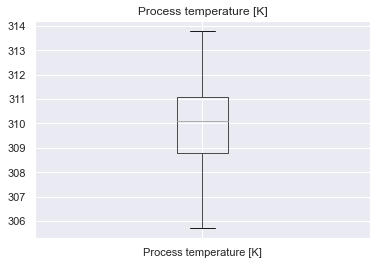

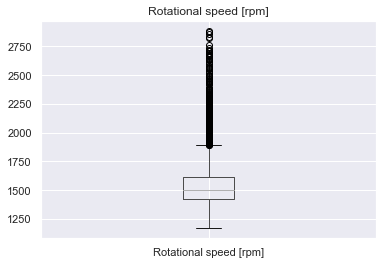

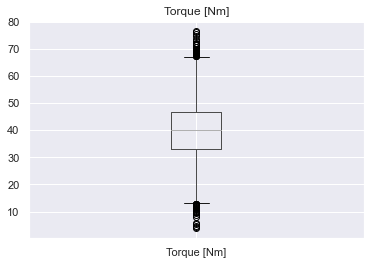

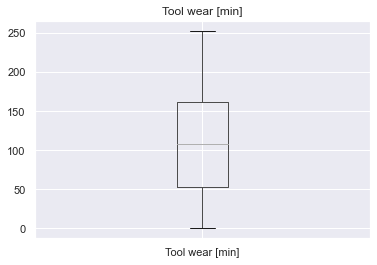

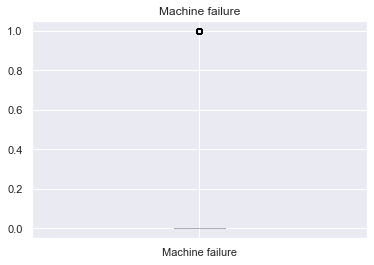

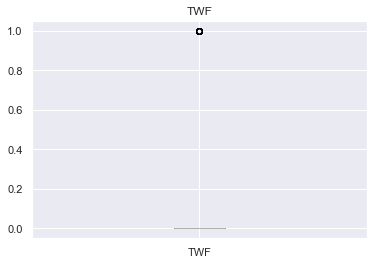

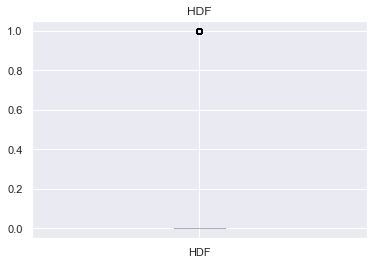

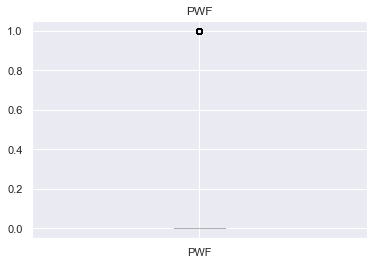

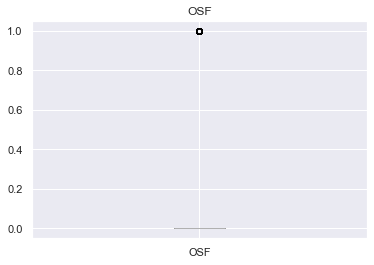

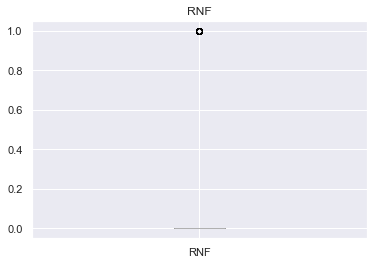

In [7]:
features = [feature for feature in data_copy.columns if data_copy[feature].dtypes !='object' and feature not in ['Air temperature [K]','Type']]
for feature in features:
    data_copy.boxplot(column = feature)
    plt.title(feature)
    plt.show()

In [8]:
px.box(data_copy, y = 'Rotational speed [rpm]')

In [9]:
data_copy[data_copy['Rotational speed [rpm]']>1895]['Rotational speed [rpm]'].count()

418

- Deleting the 418 records 

In [10]:
data_copy = data_copy[data_copy['Rotational speed [rpm]']<=1895].copy()

# Findings
- there are huge number of outliers in Rotational speed [rpm] and 'Torque [Nm]' feature.
- 418 records were removed as theree were 418 outliers in Rotational speed [rpm]
- we will see the outliers in 'Torque [Nm]' , most probably we have to drop this column 

In [11]:
px.box(data_copy, y = 'Rotational speed [rpm]')

In [12]:
px.box(data_copy, y = 'Torque [Nm]')

# Task 2: Pandas profiling


In [13]:
from pandas_profiling import ProfileReport
pf = ProfileReport(data)

In [14]:
pf

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Task Correlation

In [15]:
px.scatter(data_copy, x = 'Rotational speed [rpm]',y = 'Torque [Nm]')

- This shows high corrrelation between the two features

In [16]:
corr_matrix = data_copy.loc[:,features].corr(method = 'spearman')
px.imshow(corr_matrix, title = "Correlation Mtarix between different features")

In [17]:
px.scatter(data_copy, x = 'Rotational speed [rpm]',y = 'Air temperature [K]')

In [18]:
px.scatter(data_copy, x= 'Torque [Nm]', y = 'Air temperature [K]' )

In [19]:
corr_airtemp_torque_rotation = data_copy.loc[:,['Torque [Nm]','Air temperature [K]','Rotational speed [rpm]']].corr(method = 'spearman')
corr_airtemp_torque_rotation

,Torque [Nm],Air temperature [K],Rotational speed [rpm]
Torque [Nm],1.000000,-0.003615,-0.905087
Air temperature [K],-0.003615,1.000000,0.005727
Rotational speed [rpm],-0.905087,0.005727,1.000000


# Conclusion:

- we can drop Torque feature 
- we can drop
- HDF,PWF,OSF,TWF and RNF
- But we will perform VIF before deleting

# Feature Engineering

In [20]:
data_copy.Type.value_counts()

L    5744
M    2872
H     966
Name: Type, dtype: int64

In [21]:
# Type feature has 3 categories L,M,H where L<M<H so we can do ordinal encoding here

In [22]:
d = {'L':0,'M':1,'H':2}

In [23]:
data_copy['Type']=data_copy['Type'].map(d)

In [24]:
corr_airtemp_all = data_copy.loc[:,:].corr(method = 'spearman')
corr_airtemp_all

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
Type,1.000000,-0.012206,-0.009236,-0.001823,-0.002450,-0.006610,-0.037855,0.009643,-0.014866,-0.003962,-0.058991,-0.002864
Air temperature [K],-0.012206,1.000000,0.864228,0.005727,-0.003615,0.016233,0.088447,0.010245,0.141589,0.001865,0.003021,0.019949
Process temperature [K],-0.009236,0.864228,1.000000,0.012241,-0.009593,0.016547,0.042481,0.005411,0.065537,-0.004236,0.004810,0.023917
Rotational speed [rpm],-0.001823,0.005727,0.012241,1.000000,-0.905087,0.005387,-0.211687,0.000384,-0.163644,-0.111823,-0.135396,-0.008996
Torque [Nm],-0.002450,-0.003615,-0.009593,-0.905087,1.000000,-0.006168,0.214190,-0.011412,0.139457,0.140030,0.156484,0.011477
Tool wear [min],-0.006610,0.016233,0.016547,0.005387,-0.006168,1.000000,0.108799,0.108045,-0.001772,-0.004751,0.154914,0.011630
Machine failure,-0.037855,0.088447,0.042481,-0.211687,0.214190,0.108799,1.000000,0.366556,0.608882,0.453010,0.561575,0.005317
TWF,0.009643,0.010245,0.005411,0.000384,-0.011412,0.108045,0.366556,1.000000,-0.007313,0.013954,0.040361,0.032555
HDF,-0.014866,0.141589,0.065537,-0.163644,0.139457,-0.001772,0.608882,-0.007313,1.000000,0.026261,0.045950,-0.004913
PWF,-0.003962,0.001865,-0.004236,-0.111823,0.140030,-0.004751,0.453010,0.013954,0.026261,1.000000,0.144479,-0.003655


### Findings:
- strong relation between Air Temp and Procss Temp

# Task : log normal distribution and Scaling

# we will now check the distrribution of each variable

In [25]:
import scipy.stats as stat
import pylab 

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot
def plot_data(df,feature):
    plt.figure(figsize=(10,6))
    plt.subplot(1,2,1)
    df[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(df[feature],dist='norm',plot=pylab)
    plt.show()

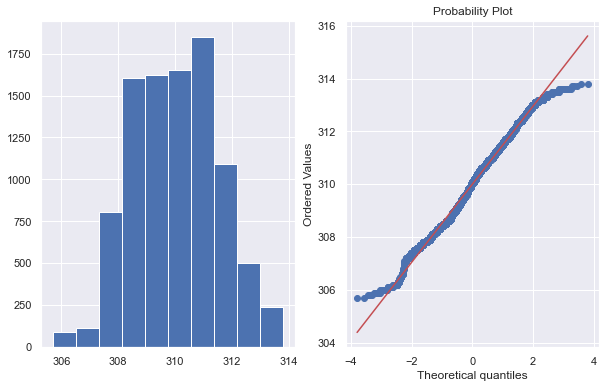

In [26]:
plot_data(data_copy, 'Process temperature [K]')

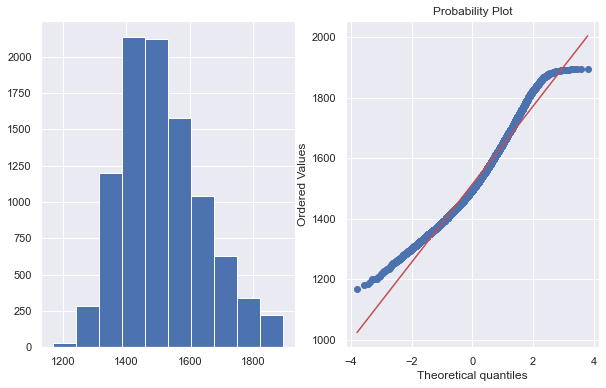

In [27]:
plot_data(data_copy, 'Rotational speed [rpm]')

array([[<AxesSubplot:title={'center':'Process temperature [K]'}>,
        <AxesSubplot:title={'center':'Rotational speed [rpm]'}>],
       [<AxesSubplot:title={'center':'Tool wear [min]'}>, <AxesSubplot:>]],
      dtype=object)

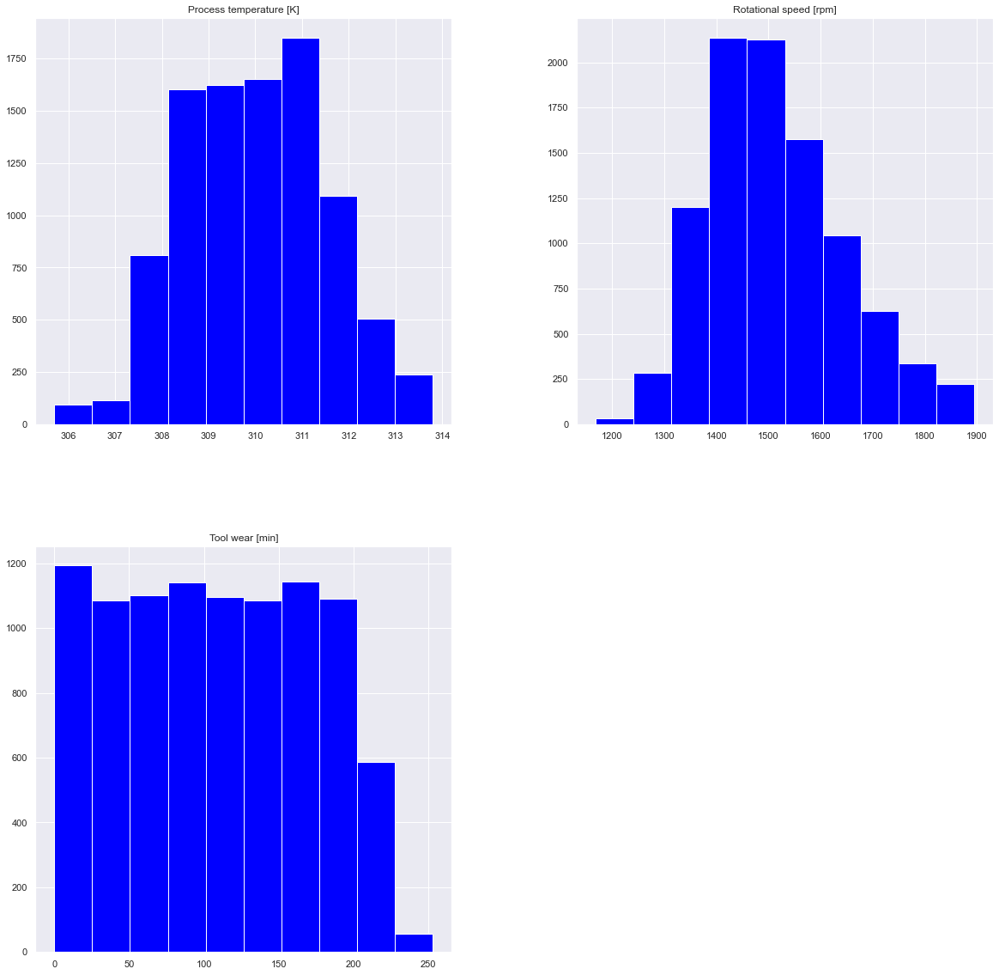

In [28]:
num_features = ['Process temperature [K]','Rotational speed [rpm]','Tool wear [min]']
data_new = data_copy[num_features].copy()
data_new.hist(figsize = (20,20), color = 'Blue')


In [29]:
for feature in num_features:
    data_copy[feature]=np.log1p(data_copy[feature])

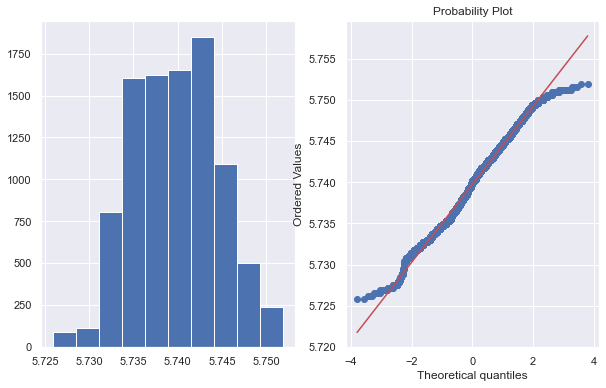

In [30]:
plot_data(data_copy, 'Process temperature [K]')

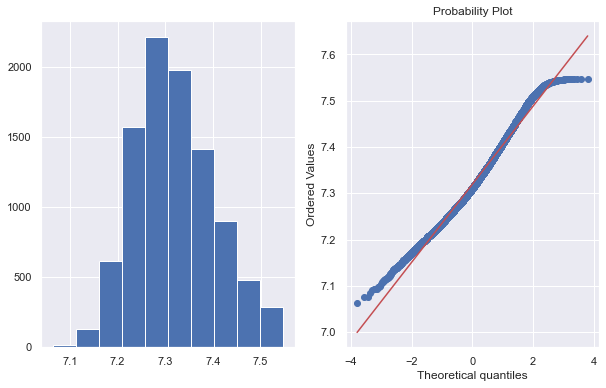

In [31]:
plot_data(data_copy, 'Rotational speed [rpm]')

In [32]:
data_copy.dtypes

Type                         int64
Air temperature [K]        float64
Process temperature [K]    float64
Rotational speed [rpm]     float64
Torque [Nm]                float64
Tool wear [min]            float64
Machine failure              int64
TWF                          int64
HDF                          int64
PWF                          int64
OSF                          int64
RNF                          int64
dtype: object

In [33]:
# Scaling since all the datapoints are in different scales
features = [feature for feature in data_copy.columns if feature in ['Process temperature [K]','Rotational speed [rpm]','Tool wear [min]','Type','Machine failure'] ]
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0, 1))
data_copy[features] = scaler.fit_transform(data_copy[features])

In [34]:
# wE CAN DROP tHE COLUMNS WHICH ARE HIUGHLY COLLINEAR WITH m<aCHIONE fAILURE COLUMN

In [35]:
data_copy.drop(['HDF','PWF','OSF','TWF','RNF','Torque [Nm]'],axis =1, inplace =True)

In [36]:
data_copy.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Tool wear [min],Machine failure
0,0.5,298.1,0.361028,0.586015,0.000000,0.0
1,0.0,298.2,0.373417,0.386130,0.250354,0.0
2,0.0,298.1,0.348635,0.514166,0.323578,0.0
3,0.0,298.2,0.361028,0.422498,0.375531,0.0
4,0.0,298.2,0.373417,0.386130,0.415829,0.0


# Model Building

In [37]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data_copy.loc[:, data_copy.columns != 'Air temperature [K]'], data_copy['Air temperature [K]'],random_state =76)

# model 1: SGD Regressor

In [38]:
from sklearn.linear_model import SGDRegressor
sgd = SGDRegressor(max_iter =1000)
sgd.fit(X_train,y_train)

SGDRegressor()

In [39]:
# I performed scaling so that I can apply SGDRegressor But it is not working good for me
sgd.score(X_train,y_train)

0.7634836327730847

In [40]:
sgd.score(X_test,y_test)

0.7682402973164212

In [41]:
def adjr2(x,y):
    r2=sgd.score(x,y)
    n=x.shape[0]
    p=x.shape[1]
    adj_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adj_r2
adjr2(X_test,y_test)

0.7677554443819368

# Model 2: LinearReg

In [42]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X_train,y_train)

LinearRegression()

In [43]:
reg.score(X_train,y_train)

0.7685489616269383

In [44]:
reg.score(X_test,y_test)

0.7735439061053901

In [45]:
def adjr2(x,y):
    r2=reg.score(x,y)
    n=x.shape[0]
    p=x.shape[1]
    adj_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adj_r2
adjr2(X_test,y_test)

0.7730701485867821

# Model 3: Regularisation: Ridge

In [46]:
from sklearn.linear_model import SGDRegressor
sgd_ridge = SGDRegressor(max_iter =1000, penalty='l2')
sgd_ridge.fit(X_train,y_train)

SGDRegressor()

In [47]:
# I performed scaling so that I can apply SGDRegressor But it is not working good for me
sgd_ridge.score(X_train,y_train)

0.7643632164018065

In [48]:
sgd_ridge.score(X_test,y_test)

0.7693815908035552

In [49]:
def adjr2(x,y):
    r2=sgd_ridge.score(x,y)
    n=x.shape[0]
    p=x.shape[1]
    adj_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adj_r2
adjr2(X_test,y_test)

0.7688991255123492

# Model 4: Regularisation: Lasso

In [50]:
from sklearn.linear_model import SGDRegressor
sgd_lasso = SGDRegressor(max_iter =1000, penalty='l1')
sgd_lasso.fit(X_train,y_train)

SGDRegressor(penalty='l1')

In [51]:
# I performed scaling so that I can apply SGDRegressor But it is not working good for me

sgd_lasso.score(X_train,y_train)

0.7639395297022864

In [52]:
sgd_lasso.score(X_test,y_test)

0.7688325564776531

In [53]:
def adjr2(x,y):
    r2=sgd_lasso.score(x,y)
    n=x.shape[0]
    p=x.shape[1]
    adj_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adj_r2
adjr2(X_test,y_test)

0.7683489425790708

# Model 5: SGD with Ploynomial Reg

In [54]:
from sklearn.preprocessing import PolynomialFeatures

In [55]:
LRtrain_accuracy = []
LRtest_accuracy = []
SGDl2train_accuracy = []
SGDl2test_accuracy = []
SGDl1train_accuracy = []
SGDl1test_accuracy = []
for i in range(1,10):
    poly_features = PolynomialFeatures(degree = i, include_bias =False)
    # Generating Features
    X_poly = poly_features.fit_transform(X_train)
    
    # Using Linear Regression
    linearreg = LinearRegression()
    linearreg.fit(X_poly,y_train)
    LRtrain_accuracy.append(linearreg.score(X_poly,y_train))
    LRtest_accuracy.append(linearreg.score(poly_features.fit_transform(X_test),y_test))
    
    
    if i>=2: # Suspecting overfitting from here
        # Reguralizing ML Model using L1
        sgd_lasso = SGDRegressor(max_iter =1000, penalty='l1')
        sgd_lasso.fit(X_poly,y_train)
        SGDl1train_accuracy.append(sgd_lasso.score(X_poly,y_train))
        SGDl1test_accuracy.append(sgd_lasso.score(poly_features.fit_transform(X_test),y_test))
        
        # Reguralizing ML Model using L2 
        sgd_ridge = SGDRegressor(max_iter =1000, penalty='l2')
        sgd_ridge.fit(X_poly,y_train)
        SGDl2train_accuracy.append(sgd_ridge.score(X_poly,y_train))
        SGDl2test_accuracy.append(sgd_ridge.score(poly_features.fit_transform(X_test),y_test))
        
    
    

In [56]:
d = {'LRtrain':LRtrain_accuracy,
     'LRtest' : LRtest_accuracy
    }
df_reg = pd.DataFrame(d, columns = d.keys(), index = np.arange(1,10))

In [57]:
df_reg

,LRtrain,LRtest
1,0.768549,7.735439e-01
2,0.769766,7.740336e-01
3,0.772303,7.724837e-01
4,0.775091,7.687812e-01
5,0.779676,7.164283e-01
6,0.783868,-4.494810e+15
7,0.792503,-1.442416e+15
8,0.796626,-1.235301e+14
9,0.801866,-5.401964e+12


In [58]:
# there are some negative accuracy , we will remove them
df_reg.drop([6,7,8,9], inplace =True)

In [59]:
px.line(df_reg, x = df_reg.index , y = ['LRtrain','LRtest'])

In [60]:
d1= {'SGDL1_train':SGDl1train_accuracy,
    'SGDL1_test' :SGDl1test_accuracy,
    'SGDL2_train':SGDl2train_accuracy,
    'SGDL2_test' :SGDl2test_accuracy,
    }
SGDreg = pd.DataFrame(d1, columns = d1.keys(), index = np.arange(2,10))

In [61]:
px.line(SGDreg, x = SGDreg.index, y = ['SGDL1_train', 'SGDL1_test', 'SGDL2_train', 'SGDL2_test'])

In [62]:
from sklearn.linear_model import Ridge, Lasso,ElasticNet,RidgeCV,LassoCV,ElasticNetCV,LinearRegression

# Model6: LassoCV

In [63]:
lassocv = LassoCV(cv =50, max_iter=2000000, normalize=True)
lassocv.fit(X_train,y_train)

LassoCV(cv=50, max_iter=2000000, normalize=True)

In [64]:
print(lassocv.score(X_train,y_train))
print(lassocv.score(X_test,y_test))

0.768451718500488
0.7737436833328702


In [65]:
def adjr2(x,y):
    r2=lassocv.score(x,y)
    n=x.shape[0]
    p=x.shape[1]
    adj_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adj_r2
adjr2(X_test,y_test)

0.7732703437582528

In [66]:
lasso = Lasso(alpha = lassocv.alpha_)
lasso.fit(X_train,y_train)

Lasso(alpha=0.00010990954612740249)

In [67]:
print(lasso.score(X_train,y_train))
print(lasso.score(X_test,y_test))

0.7685484983701787
0.7735640926512916


In [68]:
def adjr2(x,y):
    r2=lasso.score(x,y)
    n=x.shape[0]
    p=x.shape[1]
    adj_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adj_r2
adjr2(X_test,y_test)

0.7730903773639511

# Model7: RidgeCV

In [69]:
ridgecv = RidgeCV(cv =50, normalize=True, alphas = np.random.uniform(0,10,50))
ridgecv.fit(X_train,y_train)

RidgeCV(alphas=array([5.9812235 , 8.59011507, 2.27801179, 4.72992139, 9.20717154,
       2.07124496, 4.78515081, 6.64064855, 6.44410271, 5.20450619,
       3.22181134, 2.75936522, 1.22580916, 8.88929213, 1.00955911,
       7.22521172, 5.28308621, 8.67800734, 9.79753278, 5.90506734,
       5.22728995, 9.07488164, 5.47682455, 5.48016083, 7.4708736 ,
       0.27395752, 5.40448466, 4.14471304, 2.24136572, 8.32384325,
       9.48121281, 8.70548859, 6.18868996, 8.35803255, 9.42070031,
       9.13785683, 5.57385748, 3.6827926 , 8.86393592, 2.79784028,
       2.44777297, 2.78739137, 4.99310966, 5.99834649, 2.91431171,
       2.40947297, 1.29639152, 2.16724283, 4.4411405 , 0.8334215 ]),
        cv=50, normalize=True)

In [70]:
print(ridgecv.score(X_train,y_train))
print(ridgecv.score(X_test,y_test))

0.7333195610584885
0.738241961885302


In [71]:
ridge = Ridge(alpha = ridgecv.alpha_)
ridge.fit(X_train,y_train)

Ridge(alpha=0.27395751673726987)

In [72]:
print(ridge.score(X_train,y_train))
print(ridge.score(X_test,y_test))

0.7685479649611886
0.7735447762545267


# Model8: ElasticCV

In [73]:
elasticv = ElasticNetCV(alphas = None, cv =10)
elasticv.fit(X_train,y_train)

ElasticNetCV(cv=10)

In [74]:
elastic = ElasticNet(alpha=elasticv.alpha_, l1_ratio=elasticv.l1_ratio )
elastic.fit(X_train,y_train)

ElasticNet(alpha=0.0006370492322635577)

In [75]:
print(elastic.score(X_train,y_train))
print(elastic.score(X_test,y_test))

0.768461534374032
0.7735303744201063


# Conclusion
- SGDReg giving better accuracy then anyother model

In [96]:
import pickle
file= open('air_prediction.pickle', 'wb')
# dump information to that file
pickle.dump(sgd_ridge, file)

In [77]:
X_train.head()

,Type,Process temperature [K],Rotational speed [rpm],Tool wear [min],Machine failure
8443,0.5,0.521771,0.736306,0.351416,0.0
2629,0.0,0.497085,0.632130,0.838741,0.0
9972,0.0,0.311432,0.359543,0.926420,0.0
8623,0.5,0.323837,0.483593,0.625885,0.0
9382,0.0,0.311432,0.663168,0.858462,0.0


In [78]:
data.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [97]:
model = pickle.load(open('air_prediction.pickle', 'rb'))

In [100]:
s = scaler.transform([[1,308.6,1551,0,0]])
s

array([[5.00000000e-01, 1.16188650e+04, 3.19260416e+03, 0.00000000e+00,
        0.00000000e+00]])

In [90]:
s=[[0.0,0.657261,0.726371,0.831658,0.0]]

In [101]:
model.predict(s)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2001 is different from 5)

In [89]:
X_test.head(1)

,Type,Process temperature [K],Rotational speed [rpm],Tool wear [min],Machine failure
4250,0.0,0.657261,0.726371,0.831658,0.0
